In [1]:
import os
import sys
import pickle
import jieba
import json
import operator
import statistics
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
from datetime import datetime
from collections import Counter

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

font_path = 'msjh.ttc'
font = font_manager.FontProperties(fname='msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)

### check system encoding

In [2]:
sys.getfilesystemencoding()

'utf-8'

In [3]:
jieba.set_dictionary('../jieba_data/dict.txt.big')
jieba.load_userdict('../jieba_data/userdict.txt')
stopwords = []
with open('../jieba_data/stopwords.txt', 'r', encoding='UTF-8') as file:
    for each in file.readlines():
        stopwords.append(each.strip())
    stopwords.append(' ')

stopwords[:10]

Building prefix dict from C:\Users\GIGABYTE\fin_class\jieba_data\dict.txt.big ...
Loading model from cache C:\Users\GIGABYTE\AppData\Local\Temp\jieba.u76dcdccef8b36c29aab3e633e439e35d.cache
Loading model cost 1.510 seconds.
Prefix dict has been built succesfully.


['\ufeff', '', '$', '0', '1', '2', '3', '4', '5', '6']

## 將爬下來的新聞從pickle 取出並且存成list

In [5]:
with open('../crawler/data/newhead_news.pkl', 'rb') as handle:
    data = pickle.load(handle)
    
contents = []
for news in data :
    contents.append(news['content'])

contents = [news['content'] for news in data]
 
contents = []
for news in data :
    contents.append(news['content'])
方便我自己觀察

### encoding = utf-8-sig 是為了避免一開始出現\ufeff的情況 (詳情自 https://ithelp.ithome.com.tw/articles/10187778 )

In [7]:
names = []
with open('../data/names.txt', 'r', encoding='utf-8-sig') as txt:
    names = txt.read().split('\n')
    
events = []
with open('../data/events.txt', 'r', encoding='utf-8-sig') as txt:
    events = txt.read().split('\n')

## user_pc 改成 user_define_list 表示可以自行使用自定義的清洗list

把亂碼或者不重要英文字用空格取代

In [8]:
def remove_punctuation(content_string, user_define_list=False):
    if(user_define_list):
        punctuation = user_define_list
    else:
        punctuation=list("!@#$%^&*()_+=-[]`~'\"|/\\abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ,.;{}\r\xa0\u3000、，。「」！？；：<>")
        
    for word in punctuation:
        content_string = content_string.replace(word, " ")
    return(content_string)

def remove_stopwords_from_dict(word_dict, stopwords):
    for w in stopwords:
        word_dict.pop(w, word_dict)
    return word_dict

def lcut_to_dict(lcut):
    word_dict = dict(Counter(lcut))
#     word_dict.pop(' ')
    return(remove_stopwords_from_dict(word_dict, stopwords))

def sort_dict_by_values(d):
    return(sorted(d.items(), key=lambda x: x[1], reverse=True))

跑過所有 data_contents 且用 jieba.lcut 切成詞彙做成List 
且用 remove_punctuation 來刪除不必要的符號以及英文

dictionary.pop() 用法 https://www.programiz.com/python-programming/methods/dictionary/pop
簡單來說就是把字典中出現的key(包含其value) 給刪除

In [9]:
def remove_stopwords_from_dict(word_dict, stopwords):
    for word in stopwords:
        word_dict.pop(word, word_dict)
    return word_dict

lcut to dict 在算出lcut (data_content 被詞彙切割(jieba)後的list) 的數量(用counter) 再返回成dict 存成 word_dict

且調用 remove_stopwords_from_dict 來清洗 word_dict中沒有意義的詞彙

In [10]:
def lcut_to_dict(lcut):
    word_dict = dict(Counter(lcut))
#     word_dict.pop(' ')
    return(remove_stopwords_from_dict(word_dict, stopwords))


sort_dict_by_values 使用 sorted 來將dict以value大小來排序(reverse = True 表示以降次排序) (在此意思為出現次數多寡排序) 
sorted 用法 http://www.runoob.com/python/python-func-sorted.html

In [11]:
def sort_dict_by_values(clean_dict):
    return(sorted(clean_dict.items(), key=lambda x: x[1], reverse=True))

filter and lambda 用法 https://openhome.cc/Gossip/CodeData/PythonTutorial/FunctionalProgrammingPy3.html

In [12]:
def news_containing_keyword(keyword, news_list):
    return list(filter(lambda news: keyword in news, news_list))  

def data_containing_keyword(keyword, data):
    return list(filter(lambda news: keyword in news['cutted_dict'].keys(), data))

def news_containing_keywords(keywords, news_list):
    news = news_list
    for keyword in keywords:
        news = news_containing_keyword(keyword, news)
        
    return news

### 將每一則新聞 清洗並且統計出有用詞彙後 新增到data中 (以一個dict形式)

In [13]:
# add cutted dict to each news
for i in range(len(data)):
    current_content = data[i]['content']
    current_cutted = jieba.lcut(remove_punctuation(current_content))
    data[i]['cutted_dict'] = lcut_to_dict(current_cutted)

In [14]:
data[0]['cutted_dict']  ### 表示為第一則新聞的詞彙統計次數

{'高雄市長韓國瑜': 1,
 '月': 1,
 '28': 1,
 '日': 2,
 '新加坡': 1,
 '返國': 1,
 '後': 2,
 '相繼': 1,
 '取消': 1,
 '市府': 2,
 '既定': 1,
 '行程': 2,
 '透過': 1,
 '官方': 1,
 '群組': 1,
 '感冒': 2,
 '鋼鐵': 3,
 '俠': 2,
 '林黛玉': 2,
 '密集': 2,
 '工作': 2,
 '病倒': 2,
 '韓國瑜': 6,
 '群': 1,
 '組中': 1,
 '寫道': 1,
 '謝謝': 1,
 '好友': 1,
 '關心': 1,
 '請': 1,
 '放心': 1,
 '他並': 1,
 '說': 2,
 '人': 1,
 '出國': 1,
 '幾天': 1,
 '星馬': 1,
 '的確': 1,
 '很': 2,
 '緊湊': 1,
 '確實': 1,
 '補練': 1,
 '龜息': 1,
 '大法': 1,
 '原訂': 1,
 '出席': 4,
 '台灣': 1,
 '向陽': 1,
 '盃': 1,
 '明星': 1,
 '公益': 1,
 '棒球賽': 1,
 '活動': 1,
 '臨時': 1,
 '改由': 2,
 '副市長': 1,
 '洪東煒': 2,
 '日也擬': 1,
 '國際': 1,
 '佛光': 1,
 '會': 2,
 '中華': 1,
 '總會': 1,
 '共修': 1,
 '祈福': 1,
 '法會': 1,
 '代打': 1,
 '明天': 1,
 '下午': 1,
 '排訂': 1,
 '高': 1,
 '兩岸': 1,
 '小組會議': 1,
 '稱': 1,
 '好': 1,
 '朋友': 1,
 '朱立倫': 1,
 '全力支持': 1,
 '拚': 1,
 '市政': 1,
 '藍營': 1,
 '2020': 1,
 '最強': 2,
 '人選': 2,
 '馬英九': 1,
 '推出': 1,
 '王金平': 1,
 '總統': 1,
 '只': 1,
 '做': 1,
 '一任': 1,
 '年': 1,
 '機會': 1,
 '一展長才': 1}

# Coshow

In [15]:
def get_coshow(contents):
    coshow_dict = {}
    cat_content = ' '.join(contents[:100])
    clean_content = remove_punctuation(cat_content)
    cut_content = jieba.lcut(clean_content)
    cut_content = list(filter(lambda x: x!=' ', cut_content))  ### 只取非 ' ' 的詞彙
    for i in range(len(cut_content)-1):
        wcw = cut_content[i] + cut_content[i+1]
    #     print(wcw)
        try:
            coshow_dict[wcw] = coshow_dict[wcw] + 1
        except:
            coshow_dict[wcw] = 1

    sdbv = sort_dict_by_values(coshow_dict)  ## 將dict 用降階方式旁續
    return sdbv

## Count words

In [16]:
def get_cutted_dict(list_of_news):
    cat = ' '.join(list_of_news)   ### join retrun not a list 
    cat = remove_punctuation(cat)   ### 刪除無異議字符號
    cutted = jieba.lcut(cat)  ### 以詞彙切割成lsit 
    return lcut_to_dict(cutted)

def first_n_words(cutted_dict, n, word_len=2, to=1000):
    sdbv = sort_dict_by_values(cutted_dict)
    return list(filter(lambda x: len(x[0])>=word_len and len(x[0])<=to, sdbv))[:n]

python join sourse http://www.runoob.com/python/att-string-join.html

In [17]:
cutted_dict = get_cutted_dict(contents[:1000])
high_freq_pair = first_n_words(cutted_dict, 20)
high_freq_pair   ### return a list 

[('台灣', 1726),
 ('韓國瑜', 1038),
 ('柯文哲', 989),
 ('國民黨', 895),
 ('中國', 760),
 ('民進黨', 727),
 ('臉書', 592),
 ('希望', 592),
 ('媒體', 569),
 ('指出', 552),
 ('國家', 523),
 ('一個', 516),
 ('總統', 503),
 ('蔡英文', 489),
 ('支持', 472),
 ('吳敦義', 440),
 ('華航', 429),
 ('提出', 419),
 ('王金平', 409),
 ('政治', 407)]

In [18]:
cutted_dict = get_cutted_dict(contents)

In [19]:
# 可能人名
possible_name = first_n_words(cutted_dict, 1000, 3, 3)

In [20]:
# 可能事件
possible_events = first_n_words(cutted_dict, 200, 4)

In [21]:
wc = WordCloud(max_font_size=40,
               background_color="white",
               colormap='Set2',
               font_path=font_path,
               width=1000, height=300,
              max_words=1000)

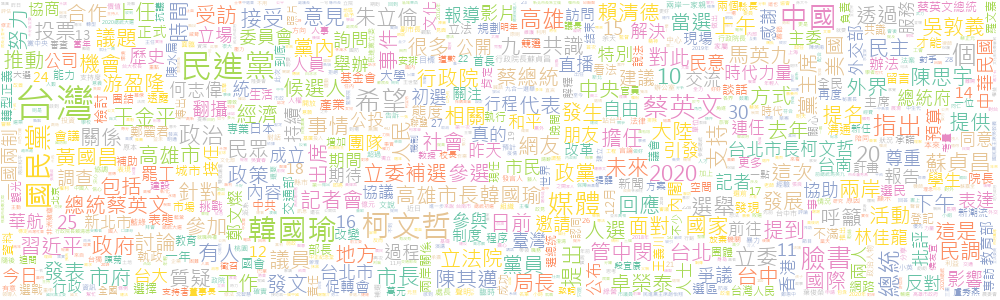

In [22]:
cutted_dict = get_cutted_dict(contents)
high_freq_pair = first_n_words(cutted_dict, 10000)

wc.generate_from_frequencies({word: freq for (word, freq) in high_freq_pair}).to_image()

In [23]:
def get_wordcloud_of_keywords(keywords, list_of_news, image_path=False):
    if type(keywords) == str:
        keywords = [keywords]
    
    if image_path:
        coloring = np.array(Image.open(os.path.join(image_path)))
        color_func = ImageColorGenerator(coloring)
        wc = WordCloud(max_font_size=30,
                       background_color="white",
                       mask=coloring,
                       color_func=color_func,
                       font_path=font_path,
                       width=1000, height=1000,
                      max_words=10000)
    else:
        wc = WordCloud(max_font_size=30,
                       background_color="white",
                       colormap='Set2',
                       font_path=font_path,
                       width=1000, height=300,
                      max_words=1000)
    
    keyword_news = news_containing_keywords(keywords, list_of_news)
    keyword_dict = get_cutted_dict(keyword_news)
    print(len(keyword_dict))
    im = wc.generate_from_frequencies(keyword_dict)
    return im

## 熱門政治人物文字雲

32298


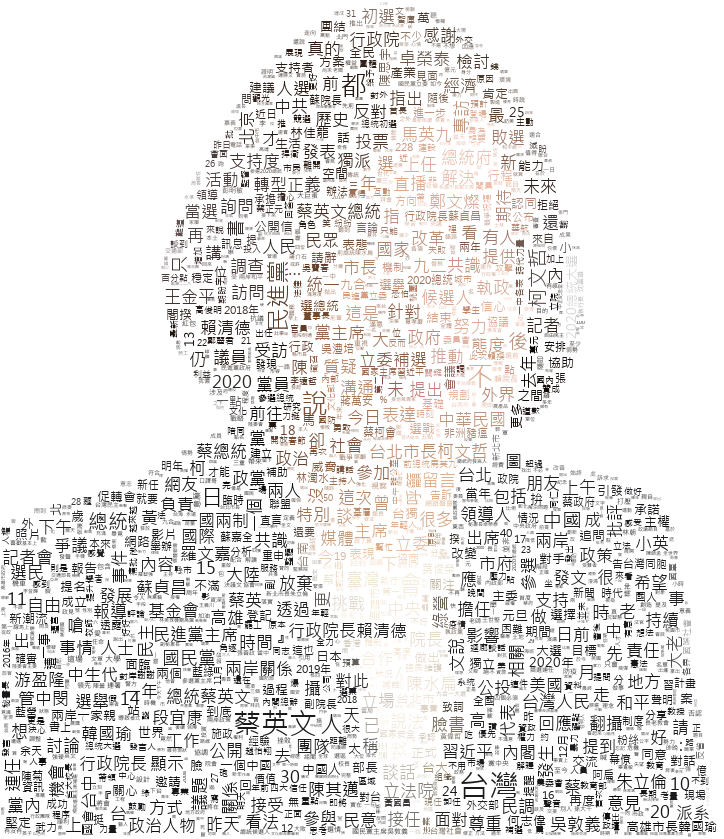

In [24]:
# 蔡英文
ten_wc = get_wordcloud_of_keywords('蔡英文', contents, '../politicians/ten.png')
ten_wc.to_file('../politicians/tenwc.png')
ten_wc.to_image()

### 查看關鍵字

In [25]:
news_containing_ten = news_containing_keyword('蔡英文', contents)
ten_dict = get_cutted_dict(news_containing_ten)
first_n_words(ten_dict, 10)

[('台灣', 2460),
 ('蔡英文', 2136),
 ('民進黨', 1559),
 ('中國', 1083),
 ('柯文哲', 1065),
 ('總統', 1019),
 ('國民黨', 788),
 ('支持', 740),
 ('媒體', 725),
 ('總統蔡英文', 709)]

25431


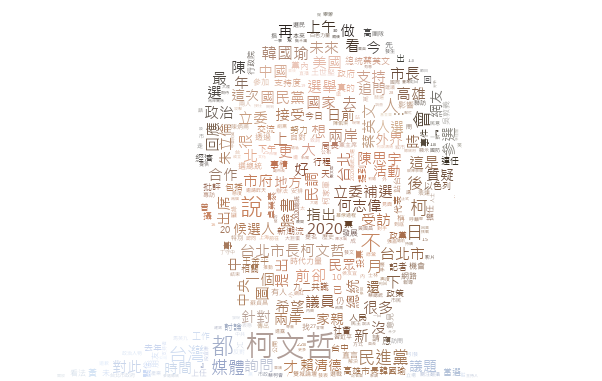

In [26]:
# 柯文哲
kp_wc = get_wordcloud_of_keywords('柯文哲', contents, image_path='../politicians/kp.png')
kp_wc.to_file('../politicians/kpwc.png')
kp_wc.to_image()

In [27]:
news_containing_kp = news_containing_keyword('柯文哲', contents)
kp_dict = get_cutted_dict(news_containing_kp)
first_n_words(kp_dict, 10)

[('柯文哲', 2880),
 ('台灣', 1058),
 ('媒體', 928),
 ('民進黨', 877),
 ('韓國瑜', 771),
 ('國民黨', 605),
 ('陳思宇', 598),
 ('蔡英文', 548),
 ('台北市長柯文哲', 540),
 ('市長', 500)]

32510


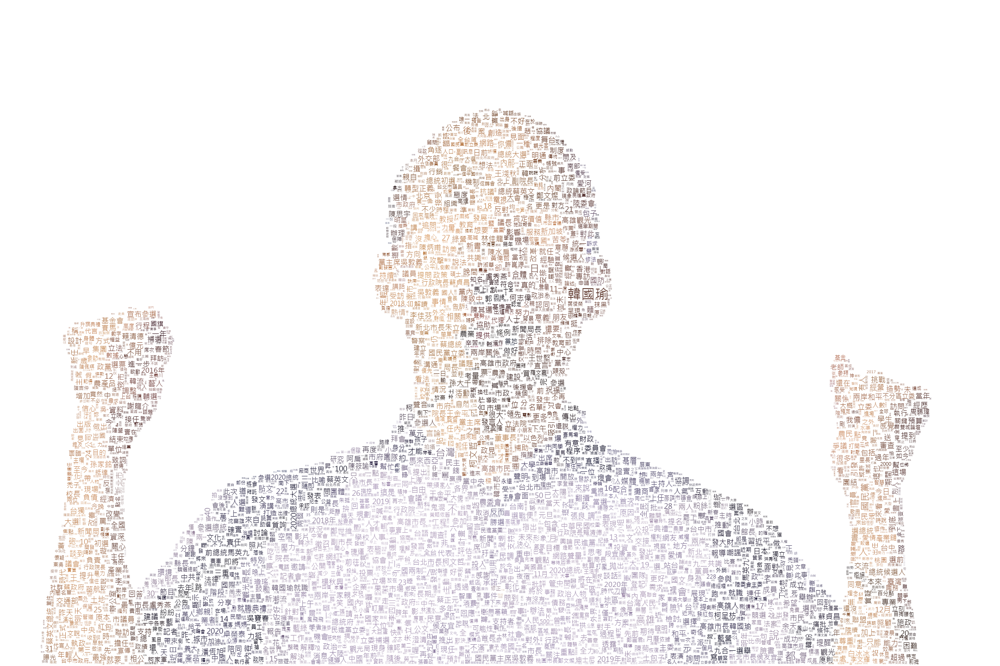

In [28]:
# 韓國瑜
han_wc = get_wordcloud_of_keywords('韓國瑜', contents, '../politicians/han.png')
han_wc.to_file('../politicians/hanwc.png')
han_wc.to_image()

In [29]:
news_containing_han = news_containing_keyword('韓國瑜', contents)
han_dict = get_cutted_dict(news_containing_han)
first_n_words(han_dict, 10)

[('韓國瑜', 2847),
 ('高雄', 1213),
 ('台灣', 1171),
 ('國民黨', 962),
 ('柯文哲', 902),
 ('媒體', 746),
 ('臉書', 654),
 ('民進黨', 638),
 ('高雄市長韓國瑜', 599),
 ('市長', 580)]

16801


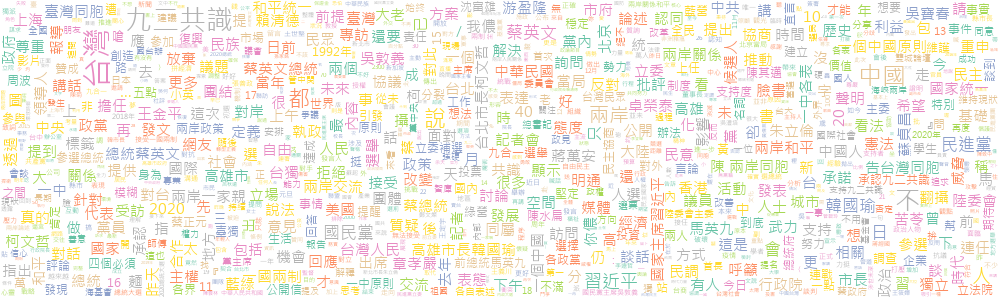

In [30]:
# 九二共識
nt_wc = get_wordcloud_of_keywords('九二共識', contents)
nt_wc.to_file('../politicians/92.png')
nt_wc.to_image()

In [32]:
hot = '九二共識'
news_containing_hot = news_containing_keywords(hot, contents)
hot_dict = get_cutted_dict(news_containing_hot)
first_n_words(hot_dict, 10, 3) # 人名

[('九二共識', 896),
 ('蔡英文', 472),
 ('韓國瑜', 455),
 ('國民黨', 450),
 ('習近平', 445),
 ('民進黨', 407),
 ('柯文哲', 321),
 ('一國兩制', 319),
 ('中華民國', 193),
 ('吳寶春', 192)]

3800


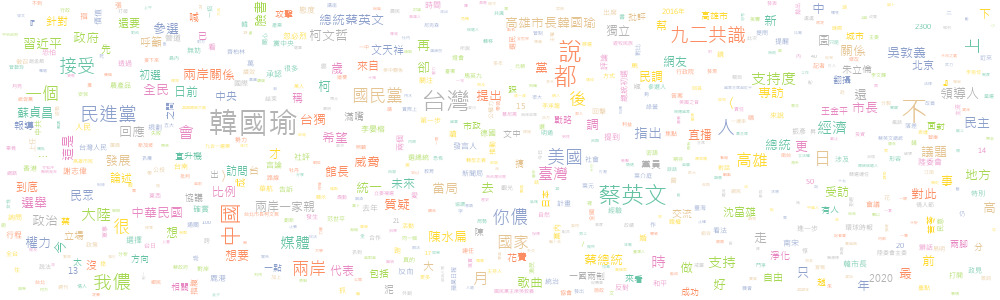

In [33]:
hotwc = get_wordcloud_of_keywords([hot, '蔡英文'], contents[:1000])
hotwc.to_image()

In [34]:
hotP = news_containing_keywords([hot, '蔡英文'], contents)
hotP_dict = get_cutted_dict(hotP)
first_n_words(hotP_dict, 10, 2)

[('台灣', 684),
 ('九二共識', 565),
 ('中國', 454),
 ('蔡英文', 414),
 ('習近平', 337),
 ('兩岸', 277),
 ('民進黨', 263),
 ('國民黨', 252),
 ('一國兩制', 223),
 ('接受', 181)]

### 定義事件

In [35]:
def merge_one_day_news_dict(one_day_dict, count='wt', divide = 1):
    all_words = set([word for each_dict in one_day_dict for word in each_dict])
    one_day_wf = {}
    for word in all_words:
        one_day_wf[word] = 0
        for news in one_day_dict:
            if count == 'wt':
                one_day_wf[word] += news.get(word, 0)/divide
            if count == 'occur':
                one_day_wf[word] += bool(news.get(word, 0))/divide
    
    return one_day_wf

# 此有ERROR  date_index 必須要Sorted 才能跑下列的 number_of_terms

In [36]:
date_list = [news['date'] for news in data]
all_date = sorted(list(set(date_list)))
aall_date = [date[5:] for date in all_date]
date_index = [date_list.index(each_date) for each_date in all_date]
date_index.append(len(date_list)-1)
date_index = sorted(date_index)
number_of_news = [date_index[i+1] - date_index[i]-1 for i in range(len(date_index)-1)]
number_of_terms = [sum([sum(data[ni]['cutted_dict'].values()) for ni in range(date_index[i], date_index[i+1])]) for i in range(len(date_index)-1)]

In [37]:
sorted(date_index)

[0,
 21,
 55,
 77,
 114,
 174,
 230,
 292,
 317,
 353,
 409,
 456,
 535,
 597,
 652,
 695,
 727,
 794,
 844,
 895,
 934,
 982,
 995,
 1006,
 1015,
 1022,
 1039,
 1063,
 1067,
 1074,
 1093,
 1133,
 1178,
 1220,
 1260,
 1309,
 1352,
 1375,
 1422,
 1472,
 1531,
 1599,
 1647,
 1676,
 1711,
 1763,
 1826,
 1877,
 1940,
 2003,
 2047,
 2067,
 2132,
 2201,
 2259,
 2318,
 2376,
 2413,
 2437,
 2504,
 2584,
 2653,
 2678,
 2700,
 2720,
 2739,
 2794,
 2853,
 2926,
 3026,
 3092,
 3124,
 3165,
 3217,
 3283,
 3351,
 3423,
 3474,
 3506,
 3530,
 3583,
 3648,
 3718,
 3761]

In [38]:
# 每日詞數
wn_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict)
#     print(all_date[i])
    wn_by_day[all_date[i]] = current_word_dict

In [39]:
wn_by_day

{'2018-12-11': {'非': 4.0,
  '謙卑': 1.0,
  '江山': 1.0,
  '依然': 2.0,
  '改由': 2.0,
  '中共': 7.0,
  '校歌': 2.0,
  '跳': 1.0,
  '濱海': 1.0,
  '反對': 3.0,
  '予': 1.0,
  '阿扁': 2.0,
  '市長': 7.0,
  '審判': 1.0,
  '病倒': 2.0,
  '游錫堃': 5.0,
  '設定': 1.0,
  '陳': 20.0,
  '系統': 2.0,
  '不當': 1.0,
  '返潮': 1.0,
  '補助': 2.0,
  '防疫': 3.0,
  '時才': 1.0,
  '巧合': 2.0,
  '國歌': 3.0,
  '道路': 1.0,
  '旅客': 1.0,
  '兩岸和平': 2.0,
  '款項': 1.0,
  '好': 12.0,
  '殺人': 1.0,
  '午安': 1.0,
  '整肅': 1.0,
  '稱': 2.0,
  '則有': 1.0,
  '關注': 5.0,
  '效果': 2.0,
  '接受': 6.0,
  '現狀': 1.0,
  '舊': 1.0,
  '密集': 2.0,
  '演講': 1.0,
  '大是': 1.0,
  '意願': 1.0,
  '黨主席吳敦義': 4.0,
  '丶': 1.0,
  '玩': 1.0,
  '自大': 1.0,
  '瓜田李下': 1.0,
  '輔導': 4.0,
  '為例': 1.0,
  '光': 3.0,
  '2018年': 2.0,
  '衛生': 1.0,
  '行政院長': 1.0,
  '柯與': 1.0,
  '機場': 2.0,
  '780': 1.0,
  '執行程序': 1.0,
  '而終': 2.0,
  '參加': 4.0,
  '雄': 1.0,
  '將會': 1.0,
  '海': 1.0,
  '二話不說': 1.0,
  '受訪': 8.0,
  '老': 2.0,
  '開放': 1.0,
  '遲': 1.0,
  '激勵': 2.0,
  '採': 2.0,
  '900': 1.0,
  '北部': 1.0,
  '便民': 1.0,
  '崙

In [40]:
# 每日詞頻
tf_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict, divide=number_of_terms[i])
#     print(all_date[i])
    tf_by_day[all_date[i]] = current_word_dict

In [41]:
tf_by_day

{'2018-12-11': {'非': 0.000756000756000756,
  '謙卑': 0.000189000189000189,
  '江山': 0.000189000189000189,
  '依然': 0.000378000378000378,
  '改由': 0.000378000378000378,
  '中共': 0.001323001323001323,
  '校歌': 0.000378000378000378,
  '跳': 0.000189000189000189,
  '濱海': 0.000189000189000189,
  '反對': 0.000567000567000567,
  '予': 0.000189000189000189,
  '阿扁': 0.000378000378000378,
  '市長': 0.0013230013230013228,
  '審判': 0.000189000189000189,
  '病倒': 0.000378000378000378,
  '游錫堃': 0.000945000945000945,
  '設定': 0.000189000189000189,
  '陳': 0.00378000378000378,
  '系統': 0.000378000378000378,
  '不當': 0.000189000189000189,
  '返潮': 0.000189000189000189,
  '補助': 0.000378000378000378,
  '防疫': 0.000567000567000567,
  '時才': 0.000189000189000189,
  '巧合': 0.000378000378000378,
  '國歌': 0.000567000567000567,
  '道路': 0.000189000189000189,
  '旅客': 0.000189000189000189,
  '兩岸和平': 0.000378000378000378,
  '款項': 0.000189000189000189,
  '好': 0.002268002268002268,
  '殺人': 0.000189000189000189,
  '午安': 0.000189000189000189

In [42]:
# 每天出現的字
occur_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict, count='occur', divide=number_of_news[i])
#     print(all_date[i])
    occur_by_day[all_date[i]] = current_word_dict

In [43]:
occur_by_day

{'2018-12-11': {'非': 0.2,
  '謙卑': 0.05,
  '江山': 0.05,
  '依然': 0.1,
  '改由': 0.05,
  '中共': 0.15000000000000002,
  '校歌': 0.05,
  '跳': 0.05,
  '濱海': 0.05,
  '反對': 0.1,
  '予': 0.05,
  '阿扁': 0.05,
  '市長': 0.35,
  '審判': 0.05,
  '病倒': 0.05,
  '游錫堃': 0.05,
  '設定': 0.05,
  '陳': 0.3,
  '系統': 0.05,
  '不當': 0.05,
  '返潮': 0.05,
  '補助': 0.05,
  '防疫': 0.1,
  '時才': 0.05,
  '巧合': 0.05,
  '國歌': 0.05,
  '道路': 0.05,
  '旅客': 0.05,
  '兩岸和平': 0.1,
  '款項': 0.05,
  '好': 0.44999999999999996,
  '殺人': 0.05,
  '午安': 0.05,
  '整肅': 0.05,
  '稱': 0.1,
  '則有': 0.05,
  '關注': 0.1,
  '效果': 0.1,
  '接受': 0.25,
  '現狀': 0.05,
  '舊': 0.05,
  '密集': 0.05,
  '演講': 0.05,
  '大是': 0.05,
  '意願': 0.05,
  '黨主席吳敦義': 0.2,
  '丶': 0.05,
  '玩': 0.05,
  '自大': 0.05,
  '瓜田李下': 0.05,
  '輔導': 0.05,
  '為例': 0.05,
  '光': 0.1,
  '2018年': 0.1,
  '衛生': 0.05,
  '行政院長': 0.05,
  '柯與': 0.05,
  '機場': 0.1,
  '780': 0.05,
  '執行程序': 0.05,
  '而終': 0.05,
  '參加': 0.1,
  '雄': 0.05,
  '將會': 0.05,
  '海': 0.05,
  '二話不說': 0.05,
  '受訪': 0.25,
  '老': 0.1,
  '開放': 0.05,

In [44]:
def first_n_wf_by_day(wf_by_day, n, word_len=2, to=1000):
    return {day: dict(first_n_words(wf_by_day[day], n, word_len=word_len, to=to)) for day in wf_by_day}

In [45]:
first_10_wf_by_day = first_n_wf_by_day(tf_by_day, 10, 2)
first_5_wf_by_day = first_n_wf_by_day(tf_by_day, 5, 2)
df1 = pd.DataFrame(first_10_wf_by_day)
df2 = pd.DataFrame(first_5_wf_by_day)
df = pd.DataFrame(wn_by_day)
df = df.fillna(0)
df_tf = pd.DataFrame(tf_by_day)
df_tf = df_tf.fillna(0)
df_occur = pd.DataFrame(occur_by_day)
df_occur = df_occur.fillna(0)

In [54]:
df.loc['2020']['2019-01-01':]

2019-01-01     4.0
2019-01-02     1.0
2019-01-03     0.0
2019-01-04     1.0
2019-01-05     3.0
2019-01-06     1.0
2019-01-07     1.0
2019-01-08     2.0
2019-01-09     7.0
2019-01-10    10.0
2019-01-11     9.0
2019-01-12    14.0
2019-01-13    12.0
2019-01-14    13.0
2019-01-15    12.0
2019-01-16     7.0
2019-01-17    11.0
2019-01-18     0.0
2019-01-19     5.0
2019-01-20     2.0
2019-01-21    15.0
2019-01-22     0.0
2019-01-23     0.0
2019-01-24     4.0
2019-01-25     4.0
2019-01-26     4.0
2019-01-27    12.0
2019-01-28    10.0
2019-01-29     2.0
2019-01-30    12.0
              ... 
2019-02-02    15.0
2019-02-03     8.0
2019-02-04    13.0
2019-02-05     3.0
2019-02-06     6.0
2019-02-07    13.0
2019-02-08    20.0
2019-02-09     8.0
2019-02-10     3.0
2019-02-11     2.0
2019-02-12     5.0
2019-02-13     1.0
2019-02-14    21.0
2019-02-15    16.0
2019-02-16    10.0
2019-02-17    10.0
2019-02-18     8.0
2019-02-19     4.0
2019-02-20     6.0
2019-02-21     5.0
2019-02-22    10.0
2019-02-23  

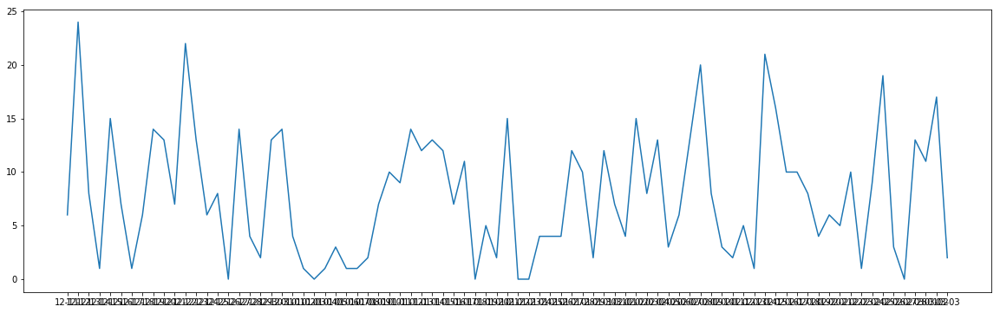

In [55]:
# word times
plt.figure(figsize=(20,6))
plt.plot(aall_date, df.loc['2020'], label='2020')
plt.show()

In [56]:
def plot_line_of_word(word, date_from='2019-01-01', date_to='2019-03-03'):
    from_index = df.columns.get_loc(date_from)
    to_index = df.columns.get_loc(date_to)+1
    date_length = to_index-from_index
    date_int = date_length//25
    font_path = 'msjh.ttc'
    font = font_manager.FontProperties(fname='msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)
    
    plt.plot(aall_date[from_index:to_index], df.loc[word][date_from:date_to], '-o', label=word)
    plt.legend(prop=font)
    #plt.xticks(list(range(0, date_length, date_int)), [aall_date[from_index:to_index][i] for i in range(0, date_length, date_int)])
    
def plot_tfdf_of_word(word, date_from='2019-01-01', date_to='2019-03-03'):
    from_index = df.columns.get_loc(date_from)
    to_index = df.columns.get_loc(date_to)+1
    date_length = to_index-from_index
    date_int = date_length//25
    font_path = 'msjh.ttc'
    font = font_manager.FontProperties(fname='msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)
    
    plt.plot(aall_date[from_index:to_index], 
             df_tf.loc[word][date_from:date_to]*df_occur.loc[word][date_from:date_to], '-o', label=word)
    plt.legend(prop=font)
    #plt.xticks(list(range(0, date_length, date_int)), [aall_date[from_index:to_index][i] for i in range(0, date_length, date_int)])

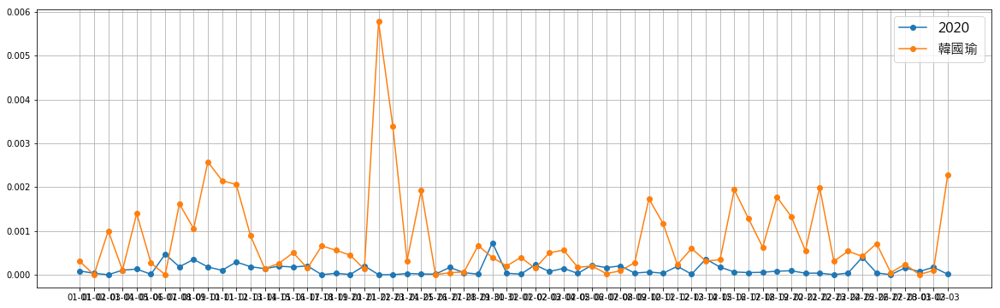

In [57]:
plt.figure(figsize=(20,6))


plot_tfdf_of_word('2020')
plot_tfdf_of_word('韓國瑜')

plt.grid()
plt.show()

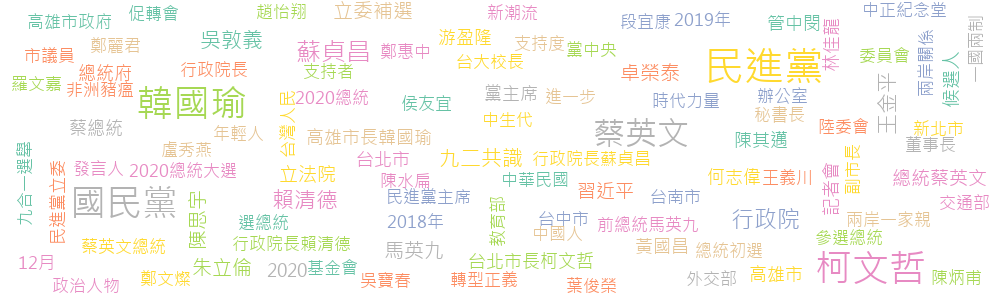

In [58]:
hot3 = first_n_words(cutted_dict, 100, 3)
hot3l = [x[0] for x in hot3]
wc.generate_from_frequencies(dict(hot3)).to_image()

In [59]:
def get_tfdf(word):
    try :
        tfdf = df_occur.loc[word] * df_tf.loc[word]
    except :
        return word
    return tfdf

def get_high_tfdf_date(word):
    try :
        tfdf = df_occur.loc[word] * df_tf.loc[word]
        m = statistics.mean(tfdf)
        s = statistics.stdev(tfdf)
        tfdf_bool = [x > m+s for x in tfdf]
        tfdf_date = {all_date[x[0]]: tfdf[x[0]] for x in list(filter(lambda e: e[1], enumerate(tfdf_bool)))}
    except :
        return  0
    return tfdf_date

# 在此做出修改 避免event中無事件導致ERROR 

def get_high_tfdf_date(word):
    
    try :
        
        tfdf = df_occur.loc[word] * df_tf.loc[word]
        m = statistics.mean(tfdf)
        
        s = statistics.stdev(tfdf)
        tfdf_bool = [x > m+s for x in tfdf]
        
        tfdf_date = {all_date[x[0]]: tfdf[x[0]] for x in list(filter(lambda e: e[1], enumerate(tfdf_bool)))}
    except :
    
        return  0
    return tfdf_date

In [60]:
hot3 = [x[0] for x in first_n_words(cutted_dict, 100, 3)]
print(hot3)
hot3_date = {word: get_high_tfdf_date(word) for word in hot3}
print(hot3_date)

['民進黨', '柯文哲', '韓國瑜', '國民黨', '蔡英文', '蘇貞昌', '行政院', '賴清德', '王金平', '吳敦義', '九二共識', '立委補選', '卓榮泰', '馬英九', '陳思宇', '朱立倫', '立法院', '候選人', '總統蔡英文', '習近平', '2020', '記者會', '黨主席', '蔡總統', '高雄市長韓國瑜', '管中閔', '陳其邁', '高雄市', '游盈隆', '黃國昌', '台北市長柯文哲', '何志偉', '林佳龍', '總統府', '台北市', '中華民國', '一國兩制', '委員會', '時代力量', '鄭文燦', '外交部', '新北市', '促轉會', '教育部', '鄭麗君', '兩岸關係', '轉型正義', '交通部', '蔡英文總統', '陳水扁', '12月', '基金會', '王義川', '台灣人民', '羅文嘉', '選總統', '新潮流', '段宜康', '支持者', '侯友宜', '董事長', '盧秀燕', '兩岸一家親', '行政院長蘇貞昌', '政治人物', '行政院長', '發言人', '葉俊榮', '台中市', '支持度', '副市長', '民進黨立委', '非洲豬瘟', '黨中央', '辦公室', '九合一選舉', '行政院長賴清德', '台南市', '高雄市政府', '2018年', '陸委會', '進一步', '中正紀念堂', '中生代', '吳寶春', '台大校長', '2020總統', '前總統馬英九', '總統初選', '2019年', '參選總統', '年輕人', '中國人', '市議員', '民進黨主席', '鄭惠中', '2020總統大選', '趙怡翔', '陳炳甫', '秘書長']
{'民進黨': {'2019-01-01': 0.00422924218884861, '2019-02-05': 0.005170671020915949, '2019-02-06': 0.005015876275051881, '2019-02-13': 0.0036669542709232106, '2019-02-16': 0.0031068431245965143, '2019-02-27': 0.0034694295942344377, '2019-02-2

In [61]:
def keyword_with_event(keyword):
    news_containing_key = news_containing_keyword(keyword, contents)
    key_dict = get_cutted_dict(news_containing_key)
    key_term = first_n_words(key_dict, 300)
    return list(filter(lambda x: x in hot4, [x[0] for x in key_term]))

def draw_event(event, i):
    event_date = get_high_tfdf_date(event)
    date_index = [all_date.index(x) for x in event_date.keys()]
    plt.scatter(date_index, [i for x in date_index], s=[x*100000 for x in list(event_date.values())])
    
def draw_by_list(tf_list, i):
    plt.scatter(aall_date, [i for x in aall_date], s=[x*10 for x in tf_list])

In [62]:
for i in events :
    print(get_high_tfdf_date(i))
    print(get_tfdf(i))

{'2019-02-01': 0.0008394895903290799, '2019-02-02': 0.0010440554095120902, '2019-02-03': 0.0008529780156139872, '2019-02-04': 0.002227634549126766, '2019-02-05': 0.0024946219837752386, '2019-02-06': 0.00174529028283969, '2019-02-07': 0.0010022643750696014, '2019-02-08': 0.0012379067249914427, '2019-03-03': 0.0009968646997347054}
2018-12-11    0.000132
2018-12-12    0.000037
2018-12-13    0.000009
2018-12-14    0.000000
2018-12-15    0.000094
2018-12-16    0.000016
2018-12-17    0.000001
2018-12-18    0.000008
2018-12-19    0.000003
2018-12-20    0.000006
2018-12-21    0.000006
2018-12-22    0.000011
2018-12-23    0.000001
2018-12-24    0.000089
2018-12-25    0.000010
2018-12-26    0.000184
2018-12-27    0.000179
2018-12-28    0.000019
2018-12-29    0.000042
2018-12-30    0.000003
2018-12-31    0.000003
2019-01-01    0.000086
2019-01-02    0.000000
2019-01-03    0.000000
2019-01-04    0.000000
2019-01-05    0.000000
2019-01-06    0.000038
2019-01-07    0.000000
2019-01-08    0.000000
20

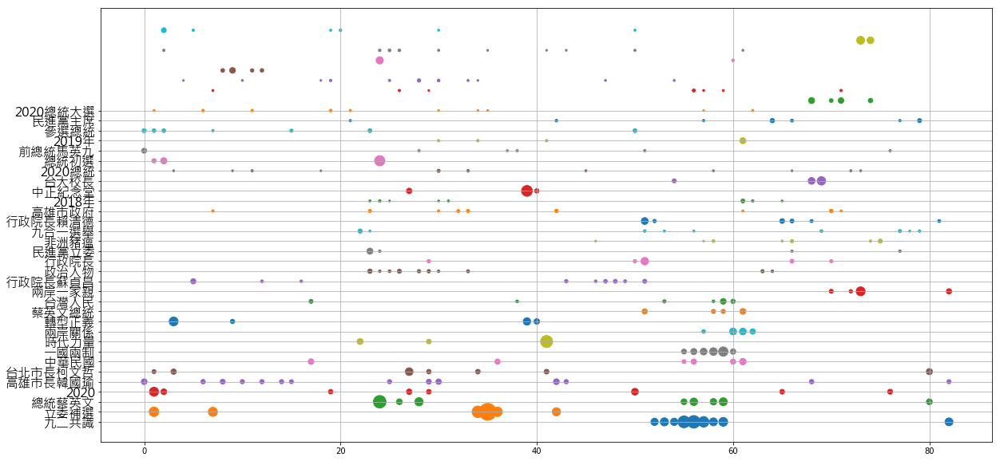

In [63]:
event_high_tfdf_dict = {e: get_high_tfdf_date(e) for e in events}

plt.figure(figsize=(20, 10))
for (i, e) in enumerate(events):
    draw_event(e, i)
# plt.xticks(range(0, 230), all_date)
#plt.xticks(list(range(0, 230, 7)), [aall_date[i] for i in range(0, 230, 7)])
plt.yticks(range(0, 32), events, fontproperties=font)

plt.grid()
plt.show()

In [64]:
# each event with tfdf of related people
event_people_dict = {}
for event in events:
    event_data = data_containing_keyword(event, data)
    # event_data[0]
    name_times_of_date = {}
    for date in all_date:
        oneday_data = list(filter(lambda data: data['date']==date, event_data))
        oneday_dict = [news['cutted_dict'] for news in oneday_data]
        current_word_dict = merge_one_day_news_dict(oneday_dict, 'wt', divide=len(oneday_data))
        possible_name = first_n_words(current_word_dict, 10000, 3, 3)
        name_times_of_date[date]= list(filter(lambda x: x[0] in names, possible_name))

    all_names = set([name for name_list in name_times_of_date.values() for (name, times) in name_list])
    event_people_dict[event] = {name: [dict(name_times_of_date[date]).get(name, 0) for date in all_date] for name in all_names}
    
with open('event_people_dict.json', 'w', encoding='utf-8') as j:
    json.dump(event_people_dict, j)

九二共識


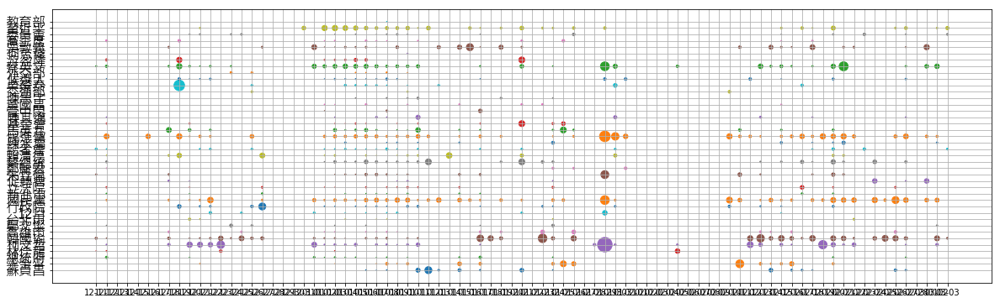

In [65]:
# event_people_dict = dict(sorted(event_people_dict.items(), key=lambda x: sum(x[1]), reverse=True)[:10])

plt.figure(figsize=(20, 6))

event = list(event_people_dict.keys())[0]
print(event)
for (i, people) in enumerate(event_people_dict[event]):
    draw_by_list(event_people_dict[event][people], i)

#plt.xticks(list(range(0, 230, 7)), [aall_date[i] for i in range(0, 230, 7)])
plt.yticks(range(0, len(event_people_dict[event])), [people for people in event_people_dict[event]], fontproperties=font)
    
plt.grid()
plt.show()

# 但如圖不方便圖示畫，所以除了文字雲方式後續將使用plotly來呈現圖表